In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=1
import os
import sys
print(sys.executable)
sys.path.append('..')

from torch.utils.tensorboard import SummaryWriter

import torch
import torch.nn as nn
import numpy as np

from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.backends.backend_pdf import PdfPages
plt.style.use('seaborn-whitegrid')
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Utils
from utils.util import num_params, imread, imwrite, impad, rgb, t
from utils.eval_utils import compute_metrics, get_inference_time, eval_diversity

def imshow(array):
    display(Image.fromarray(array))

env: CUDA_VISIBLE_DEVICES=1
/home/dbaranchuk/distill-srflow-env/bin/python3.6


In [2]:
import random
seed = random.randint(0, 2 ** 32 - 1)
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
print(seed)

3528697382


## Setting

In [3]:
scale = 4
dtype = torch.float16
device = 'cuda'

conf_path = f'../confs/SRFlow_DF2K_{scale}X.yml'
data_root = '../data'
model_root = '../pretrained_models'

## Datasets

In [4]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from datasets import DF2K
    
vis_test_dataset = DF2K(data_root, split='test', scale=scale)
test_dataset = DF2K(data_root, split='test', scale=scale, totensor=True)
assert len(test_dataset) == 100

## Create and load SRFlow Teacher

In [5]:
from utils.util import load_teacher
from utils.eval_utils import get_sr, get_sr_with_epses, get_epses

teacher_model, opt = load_teacher(conf_path, dtype=dtype, device=device)
print(f'Teacher number of parameters {num_params(teacher_model)}')

opt['GT_size'] = 128
opt['device'] = device
opt['eval_dtype'] = dtype

Teacher number of parameters 39541811


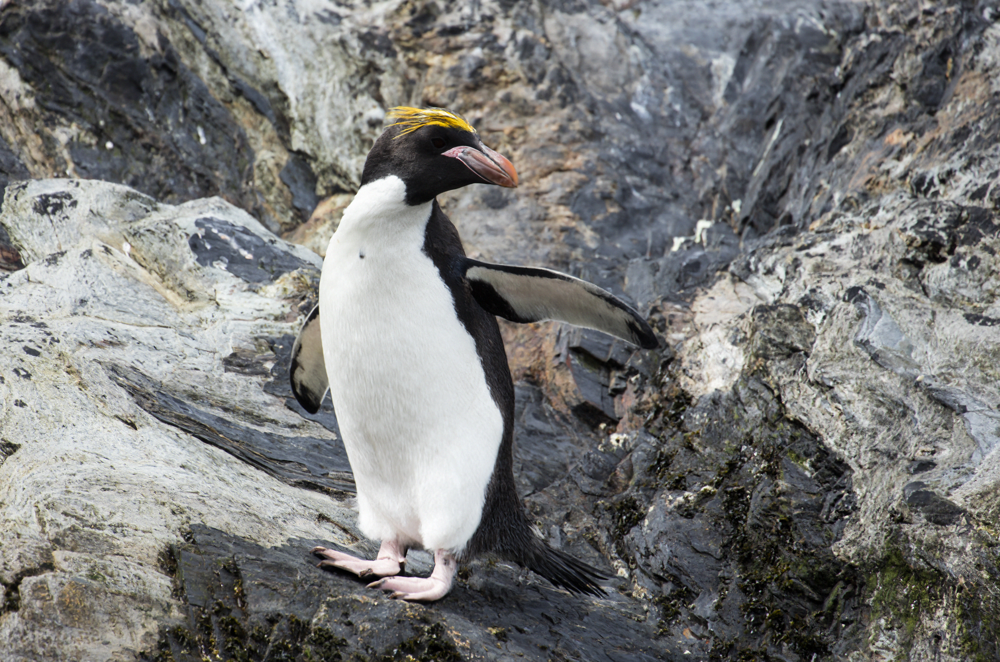

In [6]:
demo_sample = test_dataset[0][0][None]
sr = get_sr(teacher_model, opt, lq=demo_sample)
imshow(rgb(sr))

## Create and load SRFlow Student

In [7]:
from models.modules.Student_arch import StudentX4

student_model = StudentX4(K=6, opt=opt).to(device, dtype).eval()
student_model.load_state_dict(torch.load(
    os.path.join(model_root, f'SRFlow_Student_DF2K_{scale}X.pth')
))
print(f'Student number of parameters {num_params(student_model)}')

Student number of parameters 20393177


## Create and load ESRGAN

In [8]:
from models.modules.RRDBNet_arch import ESRGAN_RRDBNet
esrgan_model = ESRGAN_RRDBNet(**opt['network_G']).to(device, dtype).eval()
esrgan_model.load_state_dict(torch.load(
    os.path.join(model_root, f'RRDB_ESRGAN_x{scale}.pth')
))
print(f'ESRGAN number of parameters {num_params(esrgan_model)}')

ESRGAN number of parameters 16697987


## Create and load RRDB

In [9]:
from models.modules.RRDBNet_arch import ESRGAN_RRDBNet
rrdb_model = ESRGAN_RRDBNet(**opt['network_G']).to(device, dtype).eval()
rrdb_model.load_state_dict(torch.load(
    os.path.join(model_root, f'RRDB_DF2K_{scale}X.pth')
))
print(f'RRDB number of parameters {num_params(rrdb_model)}')

RRDB number of parameters 16697987


## Measure runtimes

In [10]:
mean, std = get_inference_time(teacher_model, opt, demo_sample)
print(f'Teacher inference time: {mean} +- {std}')

100%|██████████| 100/100 [01:26<00:00,  1.15it/s]

Teacher inference time: 860.1567163085938 +- 1.051563062834908


In [11]:
mean, std = get_inference_time(student_model, opt, demo_sample)
print(f'Student inference time: {mean} +- {std}')

100%|██████████| 100/100 [00:41<00:00,  2.38it/s]

Student inference time: 415.57786651611326 +- 1.241227387143365


In [12]:
mean, std = get_inference_time(esrgan_model, opt, demo_sample, is_rrdb=True)
print(f'ESRGAN/RRDB inference time: {mean} +- {std}')

100%|██████████| 100/100 [00:30<00:00,  3.29it/s]

ESRGAN/RRDB inference time: 299.6842697143555 +- 1.3157560190635074


## Evaluate metrics

In [13]:
test_dir = f'../results/div2k_teacher_x{scale}/'
compute_metrics(teacher_model, opt, opt['dataroot_LR'], opt['dataroot_GT'], test_dir=test_dir)

Out dir: ../results/div2k_teacher_x4/
conf: tmp, heat: 0.900, name: 0, PSNR: 27.494, SSIM: 0.808, LPIPS: 0.119, LRC PSNR: 49.817
conf: tmp, heat: 0.900, name: 1, PSNR: 31.456, SSIM: 0.803, LPIPS: 0.061, LRC PSNR: 50.074
conf: tmp, heat: 0.900, name: 2, PSNR: 37.041, SSIM: 0.901, LPIPS: 0.051, LRC PSNR: 49.732
conf: tmp, heat: 0.900, name: 3, PSNR: 25.884, SSIM: 0.732, LPIPS: 0.119, LRC PSNR: 49.780
conf: tmp, heat: 0.900, name: 4, PSNR: 26.271, SSIM: 0.692, LPIPS: 0.142, LRC PSNR: 49.758
conf: tmp, heat: 0.900, name: 5, PSNR: 27.167, SSIM: 0.804, LPIPS: 0.088, LRC PSNR: 49.725
conf: tmp, heat: 0.900, name: 6, PSNR: 18.390, SSIM: 0.466, LPIPS: 0.193, LRC PSNR: 49.106
conf: tmp, heat: 0.900, name: 7, PSNR: 24.739, SSIM: 0.725, LPIPS: 0.125, LRC PSNR: 49.498
conf: tmp, heat: 0.900, name: 8, PSNR: 29.921, SSIM: 0.796, LPIPS: 0.125, LRC PSNR: 49.888
conf: tmp, heat: 0.900, name: 9, PSNR: 24.325, SSIM: 0.686, LPIPS: 0.140, LRC PSNR: 49.837
conf: tmp, heat: 0.900, name: 10, PSNR: 27.110, SSIM

In [14]:
test_dir = f'../results/div2k_student_x{scale}/'
compute_metrics(student_model, opt, opt['dataroot_LR'], opt['dataroot_GT'], test_dir=test_dir)

Out dir: ../results/div2k_student_x4/
conf: tmp, heat: 0.900, name: 0, PSNR: 27.605, SSIM: 0.813, LPIPS: 0.120, LRC PSNR: 49.971
conf: tmp, heat: 0.900, name: 1, PSNR: 32.126, SSIM: 0.815, LPIPS: 0.055, LRC PSNR: 50.444
conf: tmp, heat: 0.900, name: 2, PSNR: 37.261, SSIM: 0.912, LPIPS: 0.052, LRC PSNR: 50.255
conf: tmp, heat: 0.900, name: 3, PSNR: 26.106, SSIM: 0.743, LPIPS: 0.120, LRC PSNR: 49.925
conf: tmp, heat: 0.900, name: 4, PSNR: 26.493, SSIM: 0.705, LPIPS: 0.141, LRC PSNR: 49.207
conf: tmp, heat: 0.900, name: 5, PSNR: 27.374, SSIM: 0.814, LPIPS: 0.088, LRC PSNR: 49.243
conf: tmp, heat: 0.900, name: 6, PSNR: 18.594, SSIM: 0.463, LPIPS: 0.191, LRC PSNR: 45.587
conf: tmp, heat: 0.900, name: 7, PSNR: 24.966, SSIM: 0.736, LPIPS: 0.127, LRC PSNR: 49.480
conf: tmp, heat: 0.900, name: 8, PSNR: 30.085, SSIM: 0.803, LPIPS: 0.124, LRC PSNR: 50.228
conf: tmp, heat: 0.900, name: 9, PSNR: 24.583, SSIM: 0.700, LPIPS: 0.135, LRC PSNR: 49.807
conf: tmp, heat: 0.900, name: 10, PSNR: 27.325, SSIM

conf: tmp, heat: 0.900, name: 89, PSNR: 23.636, SSIM: 0.685, LPIPS: 0.173, LRC PSNR: 49.725
conf: tmp, heat: 0.900, name: 90, PSNR: 26.091, SSIM: 0.785, LPIPS: 0.087, LRC PSNR: 49.652
conf: tmp, heat: 0.900, name: 91, PSNR: 29.962, SSIM: 0.901, LPIPS: 0.064, LRC PSNR: 49.429
conf: tmp, heat: 0.900, name: 92, PSNR: 30.667, SSIM: 0.707, LPIPS: 0.080, LRC PSNR: 50.859
conf: tmp, heat: 0.900, name: 93, PSNR: 30.251, SSIM: 0.841, LPIPS: 0.120, LRC PSNR: 50.087
conf: tmp, heat: 0.900, name: 94, PSNR: 18.452, SSIM: 0.513, LPIPS: 0.204, LRC PSNR: 48.736
conf: tmp, heat: 0.900, name: 95, PSNR: 36.374, SSIM: 0.875, LPIPS: 0.028, LRC PSNR: 50.511
conf: tmp, heat: 0.900, name: 96, PSNR: 20.441, SSIM: 0.659, LPIPS: 0.118, LRC PSNR: 48.583
conf: tmp, heat: 0.900, name: 97, PSNR: 32.631, SSIM: 0.835, LPIPS: 0.038, LRC PSNR: 50.688
conf: tmp, heat: 0.900, name: 98, PSNR: 30.385, SSIM: 0.858, LPIPS: 0.076, LRC PSNR: 50.213
conf: tmp, heat: 0.900, name: 99, PSNR: 26.759, SSIM: 0.792, LPIPS: 0.086, LRC P

In [15]:
test_dir = f'../results/div2k_esrgan_x{scale}/'
compute_metrics(esrgan_model, opt, opt['dataroot_LR'], opt['dataroot_GT'], test_dir=test_dir, is_rrdb=True)

Out dir: ../results/div2k_esrgan_x4/
conf: tmp, heat: 0.900, name: 0, PSNR: 26.819, SSIM: 0.808, LPIPS: 0.126, LRC PSNR: 42.192
conf: tmp, heat: 0.900, name: 1, PSNR: 31.434, SSIM: 0.806, LPIPS: 0.059, LRC PSNR: 43.810
conf: tmp, heat: 0.900, name: 2, PSNR: 37.567, SSIM: 0.939, LPIPS: 0.039, LRC PSNR: 46.321
conf: tmp, heat: 0.900, name: 3, PSNR: 26.186, SSIM: 0.771, LPIPS: 0.142, LRC PSNR: 43.122
conf: tmp, heat: 0.900, name: 4, PSNR: 25.993, SSIM: 0.695, LPIPS: 0.193, LRC PSNR: 41.754
conf: tmp, heat: 0.900, name: 5, PSNR: 25.963, SSIM: 0.815, LPIPS: 0.073, LRC PSNR: 42.213
conf: tmp, heat: 0.900, name: 6, PSNR: 17.139, SSIM: 0.400, LPIPS: 0.220, LRC PSNR: 34.298
conf: tmp, heat: 0.900, name: 7, PSNR: 23.501, SSIM: 0.720, LPIPS: 0.127, LRC PSNR: 41.088
conf: tmp, heat: 0.900, name: 8, PSNR: 29.002, SSIM: 0.787, LPIPS: 0.127, LRC PSNR: 43.367
conf: tmp, heat: 0.900, name: 9, PSNR: 23.647, SSIM: 0.684, LPIPS: 0.136, LRC PSNR: 40.570
conf: tmp, heat: 0.900, name: 10, PSNR: 26.491, SSIM:

conf: tmp, heat: 0.900, name: 89, PSNR: 21.994, SSIM: 0.672, LPIPS: 0.144, LRC PSNR: 41.346
conf: tmp, heat: 0.900, name: 90, PSNR: 24.686, SSIM: 0.758, LPIPS: 0.091, LRC PSNR: 42.116
conf: tmp, heat: 0.900, name: 91, PSNR: 29.709, SSIM: 0.916, LPIPS: 0.080, LRC PSNR: 42.487
conf: tmp, heat: 0.900, name: 92, PSNR: 30.813, SSIM: 0.727, LPIPS: 0.099, LRC PSNR: 44.950
conf: tmp, heat: 0.900, name: 93, PSNR: 29.743, SSIM: 0.858, LPIPS: 0.083, LRC PSNR: 43.588
conf: tmp, heat: 0.900, name: 94, PSNR: 17.035, SSIM: 0.456, LPIPS: 0.220, LRC PSNR: 35.841
conf: tmp, heat: 0.900, name: 95, PSNR: 36.862, SSIM: 0.912, LPIPS: 0.038, LRC PSNR: 47.327
conf: tmp, heat: 0.900, name: 96, PSNR: 20.263, SSIM: 0.656, LPIPS: 0.116, LRC PSNR: 38.521
conf: tmp, heat: 0.900, name: 97, PSNR: 32.090, SSIM: 0.843, LPIPS: 0.039, LRC PSNR: 42.752
conf: tmp, heat: 0.900, name: 98, PSNR: 29.928, SSIM: 0.877, LPIPS: 0.060, LRC PSNR: 43.510
conf: tmp, heat: 0.900, name: 99, PSNR: 25.895, SSIM: 0.794, LPIPS: 0.090, LRC P

In [16]:
test_dir = '../results/div2k_rrdb_x4/'
compute_metrics(rrdb_model, opt, opt['dataroot_LR'], opt['dataroot_GT'], test_dir=test_dir, is_rrdb=True)

Out dir: ../results/div2k_rrdb_x4/
conf: tmp, heat: 0.900, name: 0, PSNR: 30.021, SSIM: 0.882, LPIPS: 0.250, LRC PSNR: 49.890
conf: tmp, heat: 0.900, name: 1, PSNR: 35.416, SSIM: 0.909, LPIPS: 0.115, LRC PSNR: 49.345
conf: tmp, heat: 0.900, name: 2, PSNR: 41.458, SSIM: 0.974, LPIPS: 0.067, LRC PSNR: 50.741
conf: tmp, heat: 0.900, name: 3, PSNR: 28.015, SSIM: 0.826, LPIPS: 0.260, LRC PSNR: 50.406
conf: tmp, heat: 0.900, name: 4, PSNR: 28.656, SSIM: 0.804, LPIPS: 0.460, LRC PSNR: 51.042
conf: tmp, heat: 0.900, name: 5, PSNR: 29.304, SSIM: 0.889, LPIPS: 0.171, LRC PSNR: 48.279
conf: tmp, heat: 0.900, name: 6, PSNR: 20.433, SSIM: 0.577, LPIPS: 0.470, LRC PSNR: 40.729
conf: tmp, heat: 0.900, name: 7, PSNR: 27.066, SSIM: 0.820, LPIPS: 0.268, LRC PSNR: 47.618
conf: tmp, heat: 0.900, name: 8, PSNR: 32.477, SSIM: 0.882, LPIPS: 0.224, LRC PSNR: 50.313
conf: tmp, heat: 0.900, name: 9, PSNR: 26.979, SSIM: 0.813, LPIPS: 0.367, LRC PSNR: 48.743
conf: tmp, heat: 0.900, name: 10, PSNR: 29.245, SSIM: 0

conf: tmp, heat: 0.900, name: 89, PSNR: 25.478, SSIM: 0.770, LPIPS: 0.312, LRC PSNR: 48.233
conf: tmp, heat: 0.900, name: 90, PSNR: 27.852, SSIM: 0.859, LPIPS: 0.163, LRC PSNR: 49.911
conf: tmp, heat: 0.900, name: 91, PSNR: 32.083, SSIM: 0.944, LPIPS: 0.092, LRC PSNR: 50.612
conf: tmp, heat: 0.900, name: 92, PSNR: 33.564, SSIM: 0.826, LPIPS: 0.448, LRC PSNR: 49.858
conf: tmp, heat: 0.900, name: 93, PSNR: 32.185, SSIM: 0.906, LPIPS: 0.180, LRC PSNR: 50.952
conf: tmp, heat: 0.900, name: 94, PSNR: 20.524, SSIM: 0.626, LPIPS: 0.487, LRC PSNR: 43.773
conf: tmp, heat: 0.900, name: 95, PSNR: 39.421, SSIM: 0.944, LPIPS: 0.154, LRC PSNR: 49.418
conf: tmp, heat: 0.900, name: 96, PSNR: 22.319, SSIM: 0.747, LPIPS: 0.314, LRC PSNR: 44.274
conf: tmp, heat: 0.900, name: 97, PSNR: 35.167, SSIM: 0.914, LPIPS: 0.248, LRC PSNR: 51.060
conf: tmp, heat: 0.900, name: 98, PSNR: 32.844, SSIM: 0.927, LPIPS: 0.084, LRC PSNR: 50.086
conf: tmp, heat: 0.900, name: 99, PSNR: 28.894, SSIM: 0.882, LPIPS: 0.163, LRC P

# Qualitative results

In [17]:
from datasets import EvalDataset

@torch.no_grad()
def get_samples(opt, dataset_name, sample_id, bbox):
    qualitative_dataset = EvalDataset(f'../data/{dataset_name}', scale=opt['scale'])
    
    lr, hr = qualitative_dataset[sample_id]
    lq = transforms.ToTensor()(lr)[None].to(opt['device'], opt['eval_dtype'])
    epses = get_epses(opt, 1, lq.shape,  opt['heat'])
    epses = [eps.to(opt['device'], opt['eval_dtype']) for eps in epses]
    
    y1,y2, x1,x2 = bbox
    sr_t = get_sr(teacher_model, opt, lq=lq, epses=epses)
    sr_t = rgb(sr_t)[y1:y2, x1:x2, :]
    imshow(sr_t)
    
    sr_s = get_sr(student_model, opt, lq=lq, epses=epses)
    sr_s = rgb(sr_s)[y1:y2, x1:x2, :]
    imshow(sr_s)
    
    sr_e = get_sr(esrgan_model, opt, lq, is_rrdb=True)
    sr_e = rgb(sr_e)[y1:y2, x1:x2, :]
    imshow(sr_e)
    
    bicubic_sr = np.asarray(lr.resize(hr.size, Image.BICUBIC))[y1:y2, x1:x2, :]
    nearest_lr = np.asarray(lr.resize(hr.size, Image.NEAREST))[y1:y2, x1:x2, :]
    hr = np.asarray(hr)[y1:y2, x1:x2, :]
    return nearest_lr, bicubic_sr, sr_s, sr_t, sr_e, hr

In [18]:
from PIL import ImageDraw

def visualize(bboxes=[(328,456,300,428), (32,160,16,144)], 
              title="Baboon from Set14", filename=None):
    fig, f_axs = plt.subplots(ncols=8, nrows=2)
    fig.set_size_inches((20, 5))
    gs = f_axs[1, 2].get_gridspec()
    # remove the underlying axes
    for ax in f_axs[:, 0]:
        ax.remove()
    for ax in f_axs[:, 1]:
        ax.remove()

    axbig = fig.add_subplot(gs[:, :1])
    axbig.set_title(title)

    image = Image.fromarray(hr)
    draw = ImageDraw.Draw(image)
    for i, bbox in enumerate(bboxes):
        y1, y2, x1, x2 = bbox
        color = (0, 0, 255) if i == 0 else (255, 0, 0)
        draw.rectangle((x1,y1,x2,y2), width=3, outline=color)
    axbig.imshow(image)
    axbig.set_axis_off()
    axbig.set_position((-0.08, 0.13, 0.60, 0.748))

    srs = {'LR': nearest_lr, 'Bicubic': bicubic_sr, 
           'SRFlow Student': sr_s, 'SRFlow Teacher': sr_t, 
           'ESRGAN':sr_e, 'HR':hr}

    for i, bbox in enumerate(bboxes):
        y1,y2,x1,x2 = bbox
        for ax, (name, sample) in zip(f_axs[i, 2:].flatten(), srs.items()):
            crop = sample
            ax.set_frame_on(True)
            ax.set_title(name)
            ax.imshow(Image.fromarray(crop[y1:y2,x1:x2]))
            ax.tick_params(
                axis='both', which='both',
                bottom=False, top=False, left=False, right=False,
                labelbottom=False,labelleft=False)

            for spine in ax.spines.values():
                spine.set_edgecolor('blue' if i == 0 else 'red')
                spine.set_linewidth(2)
            ax.grid(False)
            
    if filename:
        pp = PdfPages(filename)
        pp.savefig(fig, bbox_inches='tight')
        pp.close()

## Baboon

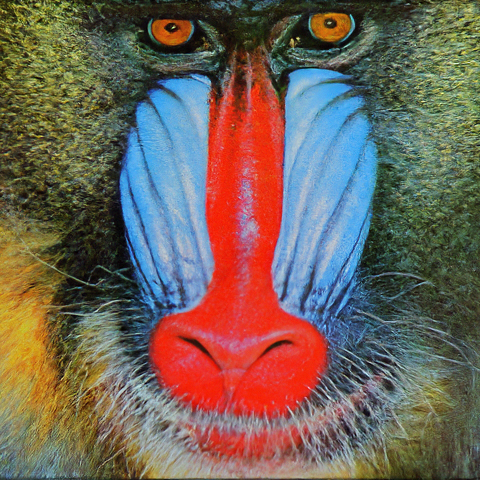

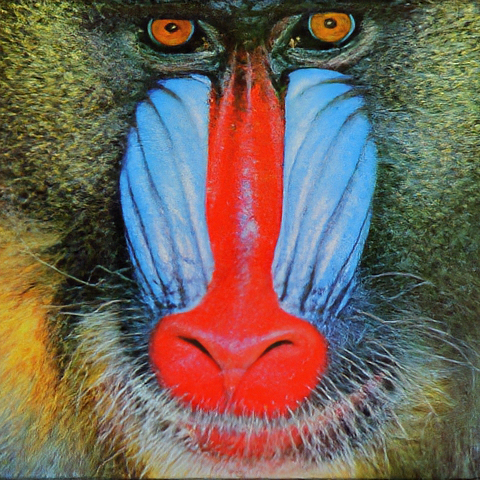

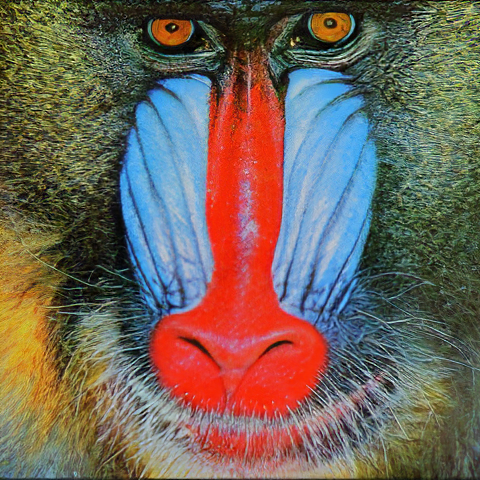

In [19]:
nearest_lr, bicubic_sr, sr_s, sr_t, sr_e, hr = get_samples(opt, 'Set14', 0, (0,480, 0,480))

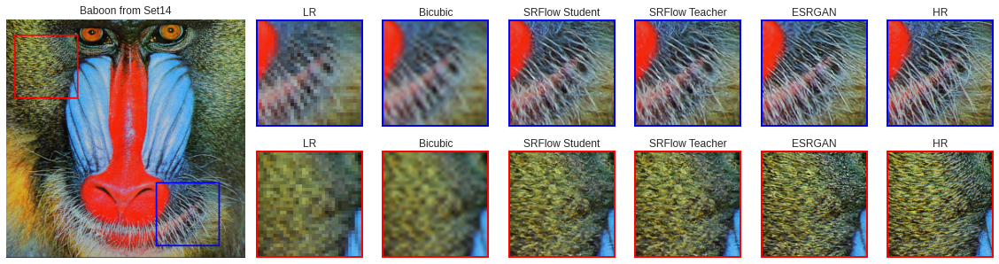

In [20]:
visualize(bboxes=[(328,456,300,428), (32,160,16,144)], 
          title="Baboon from Set14", filename='baboon_x4.pdf')

## Face

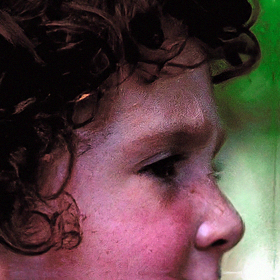

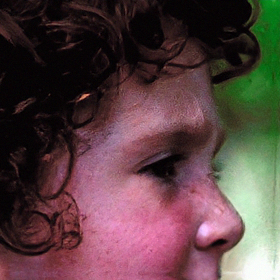

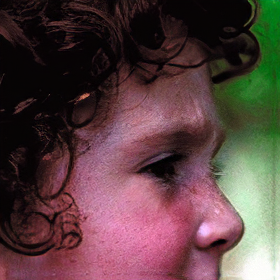

In [21]:
nearest_lr, bicubic_sr, sr_s, sr_t, sr_e, hr = get_samples(opt, 'Set14', 1, (0,500,0,500))

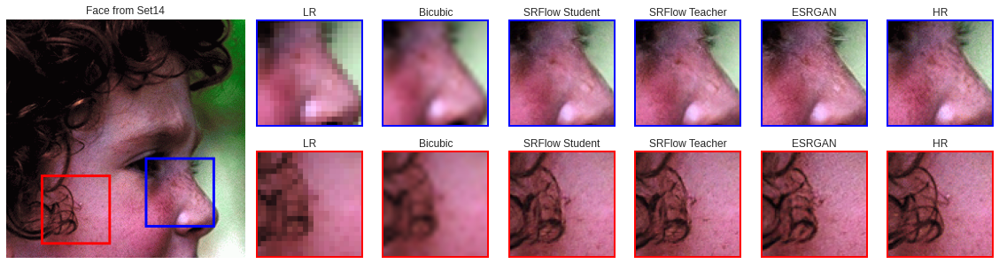

In [22]:
visualize(bboxes=[(160,240,160,240), (180,260,40,120)], 
          title='Face from Set14', filename='face_x4.pdf')

## Castle

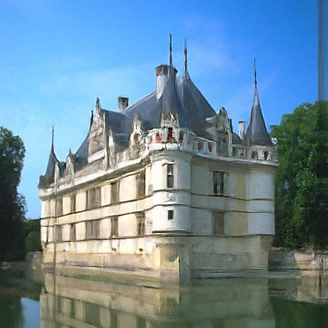

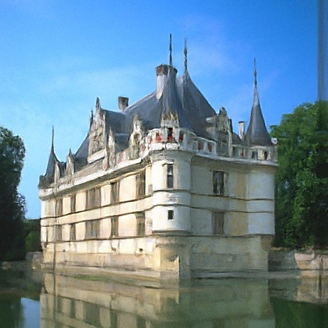

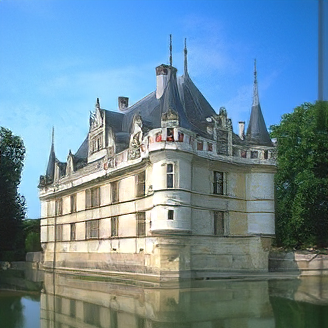

In [23]:
nearest_lr, bicubic_sr, sr_s, sr_t, sr_e, hr = get_samples(opt, 'BSDS100', 0, (0,328, 0,328))

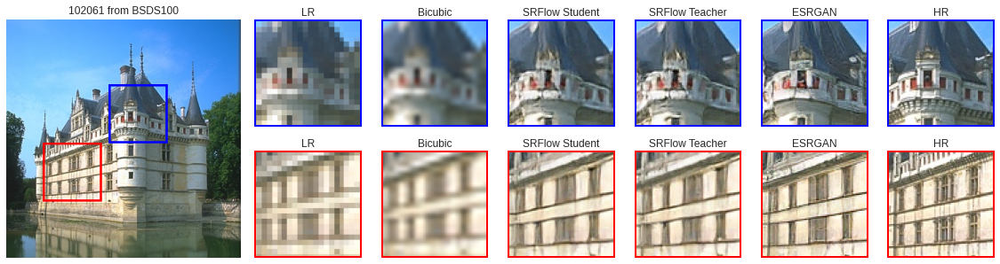

In [24]:
visualize(bboxes=[(90,170,140,220), (170,250,50,130)], 
          title='102061 from BSDS100', filename='castle_x4.pdf')

## Bird

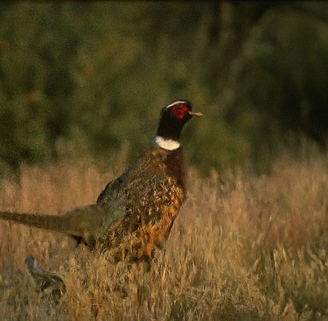

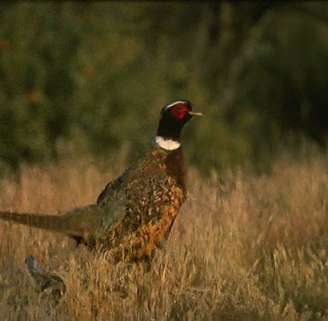

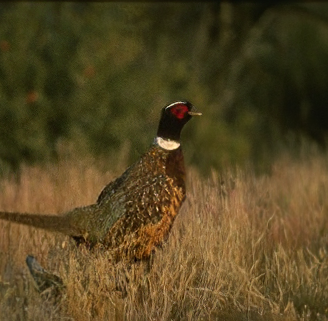

In [25]:
nearest_lr, bicubic_sr, sr_s, sr_t, sr_e, hr = get_samples(opt, 'BSDS100', 1, (0,321,120,-40))

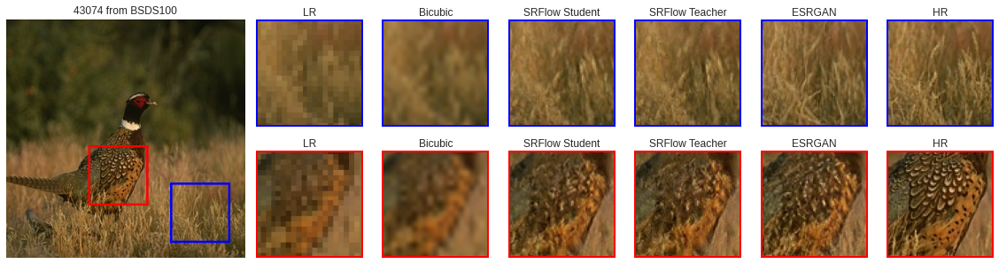

In [26]:
visualize(bboxes=[(220,300,220,300), (170,250,110,190)], 
          title='43074 from BSDS100', filename='bird_x4.pdf')

# Diversity

In [ ]:
# Note that it takes ~8 hours
teacher_diversity = eval_diversity(teacher_model, opt, opt['dataroot_LR'])
student_diversity = eval_diversity(student_model, opt, opt['dataroot_LR'])

 12%|█▏        | 12/100 [28:38<3:33:41, 145.70s/it]

In [ ]:
print(f'SRFlow Teacher diversity: {teacher_diversity}')
print(f'SRFlow Student diversity: {student_diversity}')